## Условие задачи:

Чтобы оптимизировать производственные расходы, металлургический комбинат ООО «Так закаляем сталь» решил уменьшить потребление электроэнергии на этапе обработки стали. Вам предстоит построить модель, которая предскажет температуру стали.

### Описание этапа обработки

Сталь обрабатывают в металлическом ковше вместимостью около 100 тонн. Чтобы ковш выдерживал высокие температуры, изнутри его облицовывают огнеупорным кирпичом. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами. Они установлены в крышке ковша. 

Из сплава выводится сера (десульфурация), добавлением примесей корректируется химический состав и отбираются пробы. Сталь легируют — изменяют её состав — подавая куски сплава из бункера для сыпучих материалов или проволоку через специальный трайб-аппарат (англ. tribe, «масса»).

Перед тем как первый раз ввести легирующие добавки, измеряют температуру стали и производят её химический анализ. Потом температуру на несколько минут повышают, добавляют легирующие материалы и продувают сплав инертным газом. Затем его перемешивают и снова проводят измерения. Такой цикл повторяется до достижения целевого химического состава и оптимальной температуры плавки.

Тогда расплавленная сталь отправляется на доводку металла или поступает в машину непрерывной разливки. Оттуда готовый продукт выходит в виде заготовок-слябов (англ. *slab*, «плита»).

### Описание данных

Данные состоят из файлов, полученных из разных источников:

- `data_arc.csv` — данные об электродах;
- `data_bulk.csv` — данные о подаче сыпучих материалов (объём);
- `data_bulk_time.csv` *—* данные о подаче сыпучих материалов (время);
- `data_gas.csv` — данные о продувке сплава газом;
- `data_temp.csv` — результаты измерения температуры;
- `data_wire.csv` — данные о проволочных материалах (объём);
- `data_wire_time.csv` — данные о проволочных материалах (время).

Во всех файлах столбец `key` содержит номер партии. В файлах может быть несколько строк с одинаковым значением `key`: они соответствуют разным итерациям обработки.

In [1]:
# Импорт библиотек

import math
from scipy import stats 

import numpy as np
import pandas as pd

import seaborn as sns
sns.set_style("darkgrid")
import matplotlib.pyplot as plt
%matplotlib inline

import lightgbm as lgb
from catboost import CatBoostRegressor

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression

import warnings
warnings.filterwarnings('ignore')

In [2]:
data_arc = pd.read_csv('/datasets/final_steel/data_arc.csv')
data_bulk = pd.read_csv('/datasets/final_steel/data_bulk.csv')
data_bulk_time = pd.read_csv('/datasets/final_steel/data_bulk_time.csv')
data_gas = pd.read_csv('/datasets/final_steel/data_gas.csv')
data_temp = pd.read_csv('/datasets/final_steel/data_temp.csv')
data_wire = pd.read_csv('/datasets/final_steel/data_wire.csv')
data_wire_time = pd.read_csv('/datasets/final_steel/data_wire_time.csv')

## Предобработка данных

После исследовательского анализа данных были выявлены проблемные места в датасете по электродам:

- аномальное значение -715 в реактивной мощности
- сильная корреляция активной и реактивной мощности
- несоответствие некоторых типов данных

На этапе предобработки мы устраним все эти недостатки.

In [3]:
# Избавимся от выбросов меньше нуля

data_arc = data_arc[data_arc['Реактивная мощность'] >= 0]

Введем полную мощность вместо активной и реактивной, чтобы избавиться от мультиколлинеарности. 

In [4]:
# Напишем функцию по расчету полной мощности

def full_power(row):
    full_power = math.sqrt(row['Активная мощность']**2 + row['Реактивная мощность']**2)
    return full_power

In [5]:
data_arc['Полная мощность'] = data_arc.apply(full_power, axis=1)

In [6]:
# Изменим тип данных на datetime

data_arc['Начало нагрева дугой'] = pd.to_datetime(data_arc['Начало нагрева дугой'])
data_arc['Конец нагрева дугой'] = pd.to_datetime(data_arc['Конец нагрева дугой'])

In [7]:
# Изменим тип данных у времени замера

data_temp['Время замера'] = pd.to_datetime(data_temp['Время замера'])

In [8]:
# Создадим новый признак "Общее время нагрева дугой", переведем в секунды

data_arc['Общее время нагрева дугой'] = data_arc['Конец нагрева дугой'] - data_arc['Начало нагрева дугой']
data_arc['Общее время нагрева дугой'] = data_arc['Общее время нагрева дугой'].dt.seconds

Поскольку после 2500 партии значение температуры есть только для первого измерения, сделаем срез данных.

In [9]:
data_temp = data_temp.query('key < 2500')
data_arc = data_arc.query('key < 2500')
data_bulk = data_bulk.query('key < 2500')
data_wire = data_wire.query('key < 2500')

In [10]:
# Определим количество итераций нагрева

data_arc_c = data_arc.groupby(by = 'key', as_index = False).count()[['key', 'Начало нагрева дугой']]
data_arc_c.columns = ['key', 'Количество итераций нагрева']

In [11]:
# Сгруппируем данные по партиям

data_arc = data_arc.groupby(by = 'key', as_index = False).sum()

# Добавим информацию о количестве итераций нагрева по ключу key

data_arc = data_arc.merge(data_arc_c, how = 'left', on = 'key')

In [12]:
data_arc = data_arc[['key', 'Полная мощность', 'Общее время нагрева дугой', 'Количество итераций нагрева']]

In [13]:
data_arc.head(5)

,key,Полная мощность,Общее время нагрева дугой,Количество итераций нагрева
0,1,5.826395,1098,5
1,2,3.649216,811,4
2,3,2.989534,655,5
3,4,3.814962,741,4
4,5,4.035758,869,4


In [14]:
data_arc[['Полная мощность', 'Общее время нагрева дугой', 'Количество итераций нагрева']].corr()

,Полная мощность,Общее время нагрева дугой,Количество итераций нагрева
Полная мощность,1.000000,0.982899,0.760402
Общее время нагрева дугой,0.982899,1.000000,0.795958
Количество итераций нагрева,0.760402,0.795958,1.000000


Наблюдаем сильную корреляцию между полной мощностью и общим временем нагрева дуги, придется избавиться от признака по нагреву дуги.

In [15]:
# Уберем из датасета столбец "Общее время нагрева дугой"

data_arc = data_arc[['key', 'Полная мощность', 'Количество итераций нагрева']]

In [16]:
# Очистим пропуски в данных в таблице data_temp

data_temp = data_temp.dropna(subset=['Температура']).reset_index(drop=True)
data_temp = data_temp.sort_values(by=['Время замера'])

In [17]:
# Удалим информацию о партиях по которым известно только одно измерение температуры

count = data_temp.groupby(by = 'key', as_index = False).count()
one = count[count['Время замера'] == 1]['key'].tolist()
data_temp = data_temp.query('key not in @one')

In [18]:
# Сгруппируем данные по партии по первым и последним значениям

data_temp = data_temp.groupby(by = 'key').agg(['first', 'last']).reset_index()
data_temp.columns = data_temp.columns.droplevel()
data_temp.columns = ['key', 'Время замера 1', 'Время замера 2', 'Температура 1', 'Температура 2']
data_temp = data_temp[['key', 'Температура 1', 'Температура 2']]

In [19]:
# Объединим обработанные датасеты по ключу key

data = (data_temp.merge(data_arc, how = 'left', on = 'key')
                 .merge(data_wire, how = 'left', on = 'key')
                 .merge(data_bulk, how = 'left', on = 'key')
                 .merge(data_gas, how = 'left', on = 'key')
       )


# Заполним пропуски, образовавшиеся после объединения таблиц, нулями

data = data.fillna(0)

# Переименуем столбцы для корректной работы lgbm

data = data.rename(columns={'Температура 1': 'First_temp',
                            'Температура 2': 'Last_temp',
                            'Полная мощность': 'Full_power',
                            'Количество итераций нагрева':'Heating_iterations',
                            'Газ 1': 'Gas'})

# Уберем колонку-индентификатор key, которую мы использовали для объединения датасетов

data = data.drop(['key'], axis = 1)

In [20]:
data.head(5)

,First_temp,Last_temp,Full_power,Heating_iterations,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,...,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15,Gas
0,1571.0,1613.0,5.826395,5,60.059998,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0,29.749986
1,1581.0,1602.0,3.649216,4,96.052315,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0,12.555561
2,1596.0,1599.0,2.989534,5,91.160157,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0,28.554793
3,1601.0,1625.0,3.814962,4,89.063515,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0,18.841219
4,1576.0,1602.0,4.035758,4,89.238236,9.11456,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0,5.413692


In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2475 entries, 0 to 2474
Data columns (total 29 columns):
First_temp            2475 non-null float64
Last_temp             2475 non-null float64
Full_power            2475 non-null float64
Heating_iterations    2475 non-null int64
Wire 1                2475 non-null float64
Wire 2                2475 non-null float64
Wire 3                2475 non-null float64
Wire 4                2475 non-null float64
Wire 5                2475 non-null float64
Wire 6                2475 non-null float64
Wire 7                2475 non-null float64
Wire 8                2475 non-null float64
Wire 9                2475 non-null float64
Bulk 1                2475 non-null float64
Bulk 2                2475 non-null float64
Bulk 3                2475 non-null float64
Bulk 4                2475 non-null float64
Bulk 5                2475 non-null float64
Bulk 6                2475 non-null float64
Bulk 7                2475 non-null float64
Bulk 8         

In [22]:
# Разделим нашу выборку на тестовую и обучающие выборки

train, test = train_test_split(data, test_size = 0.3, random_state = 42)

In [23]:
# Масштабируем количественные признаки

numeric = data.columns.tolist()
numeric = [i for i in numeric if i not in ('Last_temp')]
scaler = MinMaxScaler()
scaler.fit(train[numeric])

# Масштабируем обучающую выборку

train[numeric] = scaler.transform(train[numeric])

# Масштабируем тестовую выборку

test[numeric] = scaler.transform(test[numeric])

In [24]:
print('Размер обучающей выборки:', train.shape)
print('Размер тестовой выборки:', test.shape)

Размер обучающей выборки: (1732, 29)
Размер тестовой выборки: (743, 29)


In [25]:
# Определим target и features для обучающей выборки

features_train = train.drop(['Last_temp'], axis = 1)
target_train = train['Last_temp']

# Определим target и features для тестовой выборки

features_test = test.drop(['Last_temp'], axis = 1)
target_test = test['Last_temp']

### Выводы по предобработке данных

- Провели предобработку данных
- Избавились от выборосов и пустых значений
- Соединили таблицы в одну итоговую таблицу
- Разделили выборки на 30% тестовой выборки и 70% обучающей выборки
- Также провели масштабирование признаков

## Обучение моделей и подбор параметров

Для построение модели были выбраны 4 варианта: 2 вида бустинга, случайный лес и линейная регрессия. Для подбора гиперпараметров будем использовать поиск по сетке с кросс-валидацией.

In [26]:
#Определим какие модели будем использовать 

models = {
    'CatBoostRegressor': CatBoostRegressor(),
    'LGBMRegressor': lgb.LGBMRegressor(),
    'RandomForestRegressor': RandomForestRegressor(),
    'LinearRegression': LinearRegression()
}


# Параметры для каждой модели, которые будем подбирать

params = {
    'CatBoostRegressor':{
          'loss_function':['MAE'],
          'n_estimators': np.arange(300, 700, 100),  
          'learning_rate': np.arange(0.03, 0.12, 0.02),
          'random_state':[17],
          'depth': np.arange(3, 7)
    },        

    'LinearRegression':{
            'fit_intercept' : [True, False],
            'normalize':[True,False]
    },
    
    
    'LGBMRegressor': {
        'boosting_type': ['gbdt'],
        'objective': ['regression'],
        'learning_rate': [0.001, 0.01, 0.02, 0.03],
        'num_iterations':[500],
        'random_state': [42], 
        'max_depth': np.arange(2, 8),
        'metric': ['mae']
        },

    
    'RandomForestRegressor': {
        "n_estimators"      : [10,50,100],
        "max_features"      : ["auto"],
        "min_samples_split" : [2,4,8],
        "bootstrap": [True, False],
        }
}

In [27]:
# Функция для подбора гиперпараметров

def fit(train_features, train_actuals):
        for name in models.keys():
            est = models[name]
            est_params = params[name]
            gscv = GridSearchCV(estimator=est, param_grid=est_params, cv=5, verbose=2)
            gscv.fit(train_features, train_actuals)
            train_predictions = gscv.predict(features_train)
            predictions = gscv.predict(features_test)
            result_list.append({
            'model': name,
            'train_mae_score': mean_absolute_error(target_train, train_predictions),
            'test_mae_score': mean_absolute_error(target_test, predictions),
            'best_params': gscv.best_params_
            })
            

In [28]:
result_list = []
fit(features_train, target_train)

Fitting 5 folds for each of 80 candidates, totalling 400 fits
[CV] depth=3, learning_rate=0.03, loss_function=MAE, n_estimators=300, random_state=17 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


0:	learn: 10.0670604	total: 48.1ms	remaining: 14.4s
1:	learn: 10.0039332	total: 49.2ms	remaining: 7.34s
2:	learn: 9.9549494	total: 50.2ms	remaining: 4.97s
3:	learn: 9.8987088	total: 51.2ms	remaining: 3.79s
4:	learn: 9.8395984	total: 52.3ms	remaining: 3.08s
5:	learn: 9.8131231	total: 53.3ms	remaining: 2.61s
6:	learn: 9.7275821	total: 54.2ms	remaining: 2.27s
7:	learn: 9.6842832	total: 55.2ms	remaining: 2.01s
8:	learn: 9.6585278	total: 56.1ms	remaining: 1.81s
9:	learn: 9.5760320	total: 57.3ms	remaining: 1.66s
10:	learn: 9.5066530	total: 130ms	remaining: 3.41s
11:	learn: 9.4679356	total: 131ms	remaining: 3.14s
12:	learn: 9.3737921	total: 132ms	remaining: 2.91s
13:	learn: 9.3444024	total: 133ms	remaining: 2.71s
14:	learn: 9.3061286	total: 134ms	remaining: 2.54s
15:	learn: 9.2666292	total: 135ms	remaining: 2.39s
16:	learn: 9.2140622	total: 136ms	remaining: 2.26s
17:	learn: 9.1805532	total: 137ms	remaining: 2.14s
18:	learn: 9.1363050	total: 138ms	remaining: 2.04s
19:	learn: 9.1191208	total: 1

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.0s remaining:    0.0s


0:	learn: 10.2744323	total: 1.24ms	remaining: 370ms
1:	learn: 10.1920845	total: 2.4ms	remaining: 357ms
2:	learn: 10.1232596	total: 3.43ms	remaining: 339ms
3:	learn: 10.0674010	total: 4.41ms	remaining: 327ms
4:	learn: 10.0338240	total: 5.44ms	remaining: 321ms
5:	learn: 9.9935910	total: 6.43ms	remaining: 315ms
6:	learn: 9.9397295	total: 7.48ms	remaining: 313ms
7:	learn: 9.8985607	total: 8.46ms	remaining: 309ms
8:	learn: 9.8393182	total: 9.43ms	remaining: 305ms
9:	learn: 9.7901607	total: 10.5ms	remaining: 304ms
10:	learn: 9.7348213	total: 17ms	remaining: 447ms
11:	learn: 9.6901041	total: 23.4ms	remaining: 562ms
12:	learn: 9.6458700	total: 52.2ms	remaining: 1.15s
13:	learn: 9.6200001	total: 53.3ms	remaining: 1.09s
14:	learn: 9.5549848	total: 54.4ms	remaining: 1.03s
15:	learn: 9.5276099	total: 55.4ms	remaining: 984ms
16:	learn: 9.4838891	total: 56.5ms	remaining: 940ms
17:	learn: 9.4497035	total: 57.5ms	remaining: 900ms
18:	learn: 9.4119647	total: 58.5ms	remaining: 865ms
19:	learn: 9.3919943

[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed: 49.1min finished


0:	learn: 9.9566156	total: 2.81ms	remaining: 1.68s
1:	learn: 9.7623371	total: 5.88ms	remaining: 1.76s
2:	learn: 9.6808626	total: 8.08ms	remaining: 1.61s
3:	learn: 9.5725205	total: 10.9ms	remaining: 1.62s
4:	learn: 9.4260010	total: 13.1ms	remaining: 1.55s
5:	learn: 9.3724533	total: 15.8ms	remaining: 1.56s
6:	learn: 9.1602369	total: 17.2ms	remaining: 1.46s
7:	learn: 9.0531035	total: 46.7ms	remaining: 3.46s
8:	learn: 8.9697075	total: 49.2ms	remaining: 3.23s
9:	learn: 8.9155561	total: 50.6ms	remaining: 2.98s
10:	learn: 8.7633494	total: 54.1ms	remaining: 2.9s
11:	learn: 8.6745340	total: 55.8ms	remaining: 2.74s
12:	learn: 8.5580764	total: 57.3ms	remaining: 2.59s
13:	learn: 8.4924422	total: 58.4ms	remaining: 2.44s
14:	learn: 8.4476047	total: 59.9ms	remaining: 2.33s
15:	learn: 8.3709194	total: 61ms	remaining: 2.23s
16:	learn: 8.2763608	total: 144ms	remaining: 4.92s
17:	learn: 8.2066150	total: 146ms	remaining: 4.71s
18:	learn: 8.1237678	total: 147ms	remaining: 4.49s
19:	learn: 8.0878330	total: 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  boosting_type=gbdt, learning_rate=0.001, max_depth=2, metric=mae, num_iterations=500, objective=regression, random_state=42, total=   3.1s
[CV] boosting_type=gbdt, learning_rate=0.001, max_depth=2, metric=mae, num_iterations=500, objective=regression, random_state=42 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.1s remaining:    0.0s


[CV]  boosting_type=gbdt, learning_rate=0.001, max_depth=2, metric=mae, num_iterations=500, objective=regression, random_state=42, total=   1.0s
[CV] boosting_type=gbdt, learning_rate=0.001, max_depth=2, metric=mae, num_iterations=500, objective=regression, random_state=42 
[CV]  boosting_type=gbdt, learning_rate=0.001, max_depth=2, metric=mae, num_iterations=500, objective=regression, random_state=42, total=   1.1s
[CV] boosting_type=gbdt, learning_rate=0.001, max_depth=2, metric=mae, num_iterations=500, objective=regression, random_state=42 
[CV]  boosting_type=gbdt, learning_rate=0.001, max_depth=2, metric=mae, num_iterations=500, objective=regression, random_state=42, total=   0.9s
[CV] boosting_type=gbdt, learning_rate=0.001, max_depth=2, metric=mae, num_iterations=500, objective=regression, random_state=42 
[CV]  boosting_type=gbdt, learning_rate=0.001, max_depth=2, metric=mae, num_iterations=500, objective=regression, random_state=42, total=   0.9s
[CV] boosting_type=gbdt, learn

[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:  7.8min finished


Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV] bootstrap=True, max_features=auto, min_samples_split=2, n_estimators=10 
[CV]  bootstrap=True, max_features=auto, min_samples_split=2, n_estimators=10, total=   0.2s
[CV] bootstrap=True, max_features=auto, min_samples_split=2, n_estimators=10 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV]  bootstrap=True, max_features=auto, min_samples_split=2, n_estimators=10, total=   0.1s
[CV] bootstrap=True, max_features=auto, min_samples_split=2, n_estimators=10 
[CV]  bootstrap=True, max_features=auto, min_samples_split=2, n_estimators=10, total=   0.1s
[CV] bootstrap=True, max_features=auto, min_samples_split=2, n_estimators=10 
[CV]  bootstrap=True, max_features=auto, min_samples_split=2, n_estimators=10, total=   0.1s
[CV] bootstrap=True, max_features=auto, min_samples_split=2, n_estimators=10 
[CV]  bootstrap=True, max_features=auto, min_samples_split=2, n_estimators=10, total=   0.1s
[CV] bootstrap=True, max_features=auto, min_samples_split=2, n_estimators=50 
[CV]  bootstrap=True, max_features=auto, min_samples_split=2, n_estimators=50, total=   0.6s
[CV] bootstrap=True, max_features=auto, min_samples_split=2, n_estimators=50 
[CV]  bootstrap=True, max_features=auto, min_samples_split=2, n_estimators=50, total=   0.6s
[CV] bootstrap=True, max_features=auto, min_samples_

[Parallel(n_jobs=1)]: Done  90 out of  90 | elapsed:  1.0min finished


Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] fit_intercept=True, normalize=True ..............................
[CV] ............... fit_intercept=True, normalize=True, total=   0.1s
[CV] fit_intercept=True, normalize=True ..............................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] ............... fit_intercept=True, normalize=True, total=   0.2s
[CV] fit_intercept=True, normalize=True ..............................
[CV] ............... fit_intercept=True, normalize=True, total=   0.1s
[CV] fit_intercept=True, normalize=True ..............................
[CV] ............... fit_intercept=True, normalize=True, total=   0.1s
[CV] fit_intercept=True, normalize=True ..............................
[CV] ............... fit_intercept=True, normalize=True, total=   0.2s
[CV] fit_intercept=True, normalize=False .............................
[CV] .............. fit_intercept=True, normalize=False, total=   0.1s
[CV] fit_intercept=True, normalize=False .............................
[CV] .............. fit_intercept=True, normalize=False, total=   0.1s
[CV] fit_intercept=True, normalize=False .............................
[CV] .............. fit_intercept=True, normalize=False, total=   0.1s
[CV] fit_intercept=True, normalize=False .............................
[CV] .

[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    3.0s finished


In [29]:
# Сохраним все в табличку

results = pd.DataFrame(result_list, columns=['model','train_mae_score','test_mae_score','best_params'])
results.set_index("model", inplace = True)

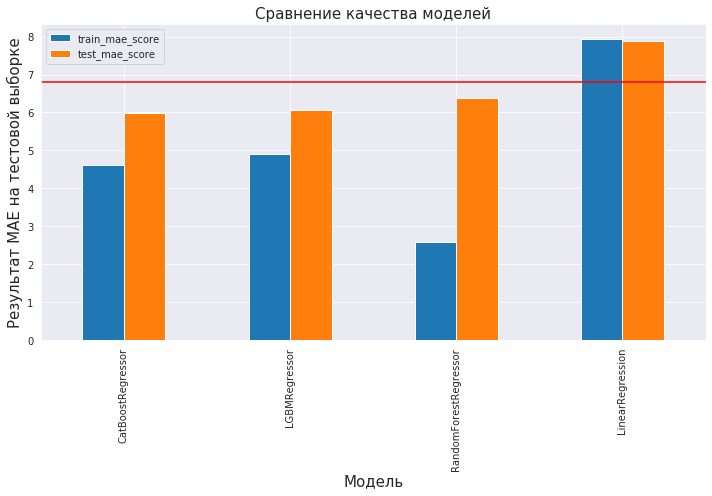

In [30]:
# Посмотрим на графике на результаты MAE на обучающей и тестовой выборках

plt.figure(figsize=(10, 7))
plt.subplot(111)
results.plot(kind='bar', ax=plt.gca()).hlines(6.8, -1, 5, color = 'r')
plt.xlabel('Модель', fontsize=15)
plt.ylabel('Результат MAE на тестовой выборке', fontsize=15)
plt.title('Сравнение качества моделей', fontsize=15)
plt.tight_layout()

In [31]:
results

,train_mae_score,test_mae_score,best_params
model,,,
CatBoostRegressor,4.622046,5.989690,"{'depth': 3, 'learning_rate': 0.09000000000000..."
LGBMRegressor,4.910220,6.065231,"{'boosting_type': 'gbdt', 'learning_rate': 0.0..."
RandomForestRegressor,2.577290,6.383517,"{'bootstrap': True, 'max_features': 'auto', 'm..."
LinearRegression,7.925578,7.895936,"{'fit_intercept': True, 'normalize': False}"


### Выводы по обучению моделей

- Провели подбор параметров к моделям CatBoost, LightGBM, RandomForest и LinearRegression
- Наилучшие результаты получили у CatBoost с результатом 5.98 на тестовой выборке
- Хуже всего показала результат модель LinearRegression с результатом 7.9 на тестовой выборке

### Финальная модель на тестовой выборке с лучшими параметрами

In [32]:
# С подобранными параметрами будем использовать модель CatBoost на тестовой выборке

model = CatBoostRegressor(depth=3, 
                          learning_rate = 0.09000000000000001, 
                          loss_function = 'MAE', 
                          n_estimators = 600, 
                          random_state = 17,
                          verbose = 0)

model.fit(features_train,target_train)
predictions = model.predict(features_test)
print('MAE на тестовой выборке:', mean_absolute_error(predictions,target_test))

MAE на тестовой выборке: 5.98968988032372


In [33]:
# Функция для отрисовки важности признаков

def plot_feature_importance(importance,names,model_type):

        feature_importance = np.array(importance)
        feature_names = np.array(names)

        data={'feature_names':feature_names,'feature_importance':feature_importance}
        fi_df = pd.DataFrame(data)

        fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

        plt.figure(figsize=(10,8))
        sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
        plt.title(model_type + 'FEATURE IMPORTANCE')
        plt.xlabel('FEATURE IMPORTANCE')
        plt.ylabel('FEATURE NAMES')

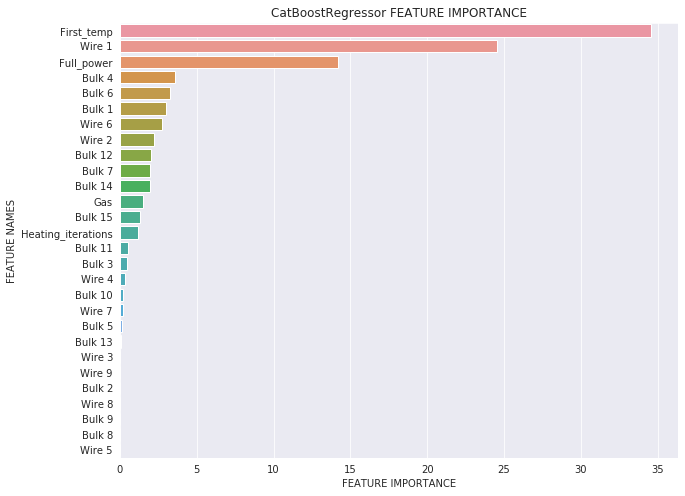

In [34]:
plot_feature_importance(model.feature_importances_,features_test.columns,'CatBoostRegressor ')

## Общий вывод

- Провели исследовательский анализ данных 
- Обработали пропуски и выбросы, которые выявили в таблицах
- Добавили несколько новых признаков для нашей модели
- Провели масштабирование признаков
- Для обучения использовали 4 модели : CatBoostRegressor, LightGBMRegressor, RandomForestRegressor, LinearRegression
- Провели подбор гиперпараметров с помощью GridSearchCV
- Получили наилучший результат MAE 5.98 на тестовой выборке c CatBoostRegressor
- Так же выявили признаки, которые больше всего влияют на модель - это начальная температура, полная мощность и Wire 1